# DeepBeef: 딥러닝을 이용한 우육 등급 판별 시스템
---
## 박종석, 이주헌, 이유정, 임선옥, 최해선

## Imports

In [1]:
import re    # 정규표현식 관련된 작업에 필요한 패키지
import os    # I/O 관련된 작업에 필요한 패키지 
import pandas as pd     # 데이터 전처리 관련된 작업에 필요한 패키지
import numpy as np      # 데이터 array 작업에 필요한 패키지
import tensorflow as tf  # 딥러닝 관련된 작업에 필요한 패키지
import matplotlib.pyplot as plt    # 데이터 시각화에 관련된 작업에 필요한 패키지
from sklearn.model_selection import train_test_split  # 데이터 전처리에 필요한 패키지
import PIL
from PIL import Image
import glob
import cv2, sys
from tensorflow import keras ## 2.3 버전 이상 필요
print(tf.__version__)

2.4.1


## 데이터 경로 지정

In [2]:
file_path = os.getenv('HOME') + '/aiffel/DeepBeef/'

## 이미지 Resizing

In [3]:
def resize_img(grade):
    file_path = os.getenv('HOME') +'/aiffel/DeepBeef/' + grade
    images = glob.glob(file_path + "/*.jpg")

    target_size = (256,256)
    for img in images:
        old_img=Image.open(img)
        new_img=old_img.resize(target_size, Image.ANTIALIAS)
        new_img.save(img,"JPEG")

    print("OK")

In [4]:
resize_img("All")

OK


## Labeling

In [5]:
def label_data(grade , num_data): #(취합 데이터 경로, 데이터 총갯수)
    file_path = os.getenv('HOME') +'/aiffel/DeepBeef/' + grade
    images = glob.glob(file_path + "/*.jpg")
    #imgs = np.zeros(256*256*3*98).reshape(98,256,256,3)
    imgs = []
    labels=np.zeros(num_data,dtype=np.int32)

    # target_size = (256,256)
    idx = 0
    if grade == "All":
        for img in images:
            if img.split('/')[6][0] == "0":
                image = cv2.imread(img)
                b,g,r = cv2.split(image) ## channel 분리 함수
                imgs_old = cv2.merge([r,g,b]) ## 분리된 값을 재결합
                imgs.append(imgs_old.reshape(256, 256, 3))    # 데이터 영역에 이미지 행렬을 복사
                labels[idx]=0   # Prime : 0
                idx=idx+1
            if img.split('/')[6][0] == "1":
                image = cv2.imread(img)
                b,g,r = cv2.split(image) ## channel 분리 함수
                imgs_old = cv2.merge([r,g,b]) ## 분리된 값을 재결합
                imgs.append(imgs_old.reshape(256, 256, 3))    # 데이터 영역에 이미지 행렬을 복사
                labels[idx]=1   # Choice : 1
                idx=idx+1
            if img.split('/')[6][0] == "2":
                image = cv2.imread(img)
                b,g,r = cv2.split(image) ## channel 분리 함수
                imgs_old = cv2.merge([r,g,b]) ## 분리된 값을 재결합
                imgs.append(imgs_old.reshape(256, 256, 3))    # 데이터 영역에 이미지 행렬을 복사
                labels[idx]=2   # Select : 2
                idx=idx+1

  
    return np.array(imgs), labels


## Train/Test Data Split

In [6]:
import numpy as np
import imgaug.augmenters as iaa
from sklearn.model_selection import train_test_split
imgs,labels = label_data("All", 256) # 이미지 로드
X_train, X_test, y_train, y_test = train_test_split(imgs,
                                                    labels,
                                                    test_size=0.2,
                                                    random_state=7)
del imgs,labels
imgs_labels = (X_train,y_train)
imgs_labels_test = (X_test,y_test)
def augment(imgs_labels):
    seq = iaa.Sequential([
        iaa.OneOf([
            #iaa.Grayscale(alpha=(0.0, 1.0)), # 색변환 필요시 주석해제
            iaa.Sometimes(
                0.5,
                iaa.AddToSaturation((-50, 50))
            )
        ]),
        iaa.Sequential([
            # iaa.Crop(percent=(0, 0.2)), #Crop 필요시 주석해제
            iaa.Affine(rotate=(-25, 25)),
        ], random_order=True)
    ])
    # 메모리 부족으로 50이 한계 
    imgs = np.array([imgs_labels[0] for _ in range(50)]).reshape(-1,256,256,3) 
    label = np.array([imgs_labels[1] for _ in range(50)]).reshape(-1,)
    imgs = seq(images = imgs)
    return imgs,label

X_train,y_train = augment(imgs_labels)
X_test,y_test = augment(imgs_labels_test)
ds_train = tf.data.Dataset.from_tensor_slices((X_train,y_train))
ds_test = tf.data.Dataset.from_tensor_slices((X_test,y_test))
del X_train,y_train,X_test,y_test


In [7]:

num_train_data = ds_train.cardinality().numpy()
num_val_data = ds_test.cardinality().numpy()
print('train data:',ds_train.cardinality().numpy())
print('test data:',ds_test.cardinality().numpy())

train data: 10200
test data: 2600


## Normalization

In [8]:
def normalize_and_resize_img(image, label):
    """Normalizes images: `uint8` -> `float32`."""
    return tf.cast(image, tf.float32) / 255., label
def apply_normalize_on_dataset(ds, is_test=False, batch_size=16 ,epoch = 10):
    ds = ds.map(
        normalize_and_resize_img,  # 기본적인 전처리 함수 적용
        num_parallel_calls=2
    )
    ds = ds.batch(batch_size)
    if not is_test:
        ds = ds.repeat(epoch)
        ds = ds.shuffle(200)
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

ds_train = apply_normalize_on_dataset(ds_train)
ds_test = apply_normalize_on_dataset(ds_test,is_test= True)
# del imgs,label

## Modeling: Resnet50

In [9]:
from tensorflow import keras
model_aug = keras.models.Sequential([
    keras.applications.resnet.ResNet50(
        include_top=False,
        weights='imagenet',
        input_shape=(256, 256,3),
        pooling='avg',
    ),
    keras.layers.Dense(3, activation = 'softmax')
])
tf.random.set_seed(2021)
model_aug.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.01),
    metrics=['accuracy'],
)
history_resnet50_aug = model_aug.fit(
    ds_train, # augmentation 적용하지 않은 데이터셋 사용
    steps_per_epoch= int(num_train_data/16), # 16은 배치 사이즈
    validation_steps = 3,
    epochs=5,
    validation_data=ds_test,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/5
637/637 [==============================] - 157s 165ms/step - loss: 0.1506 - accuracy: 0.9484 - val_loss: 1.7009 - val_accuracy: 0.4583
Epoch 2/5
637/637 [==============================] - 151s 238ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.2930 - val_accuracy: 0.9375
Epoch 3/5
637/637 [==============================] - 109s 171ms/step - loss: 7.4639e-04 - accuracy: 1.0000 - val_loss: 0.2863 - val_accuracy: 0.9375
Epoch 4/5
637/637 [==============================] - 105s 165ms/step - loss: 5.1352e-04 - accuracy: 1.0000 - val_loss: 0.2987 - val_accuracy: 0.9375
Epoch 5/5
637/637 [==============================] - 108s 170ms/step - loss: 3.3846e-04 - accuracy: 1.0000 - val_loss: 0.2975 - val_accuracy: 0.9375


In [10]:
file_path = os.getenv('HOME') + '/aiffel/DeepBeef/'
model_path = file_path + 'resnet50'
model_aug.save(model_path+'_aug_new_cam.h5') # 모델저장

## Result

0:Prime,1:Choice,2:Select
예측확률 [ 0  0 99]
예측값 2
실제 2


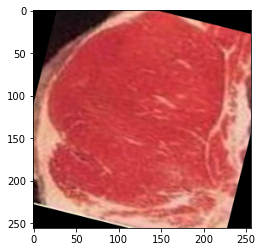

예측확률 [ 0  0 99]
예측값 2
실제 2


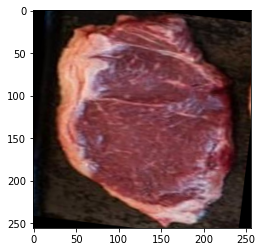

예측확률 [ 0 99  0]
예측값 1
실제 1


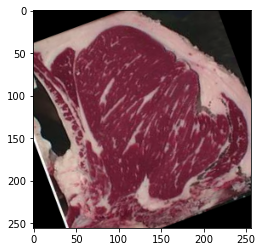

예측확률 [99  0  0]
예측값 0
실제 0


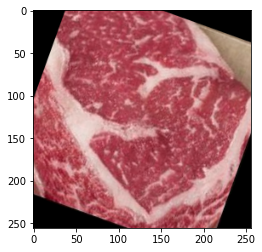

예측확률 [99  0  0]
예측값 0
실제 0


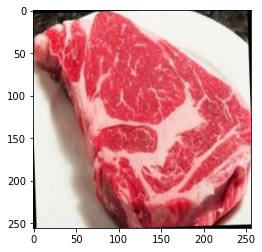

예측확률 [99  0  0]
예측값 0
실제 0


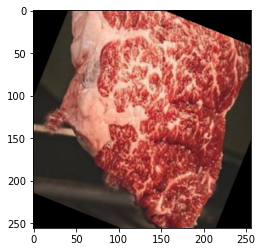

예측확률 [66 32  0]
예측값 0
실제 0


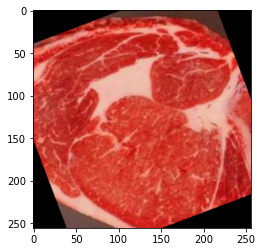

예측확률 [ 0 99  0]
예측값 1
실제 1


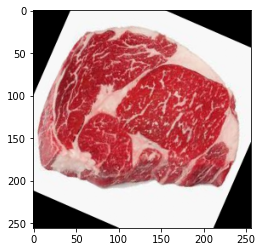

예측확률 [99  0  0]
예측값 0
실제 0


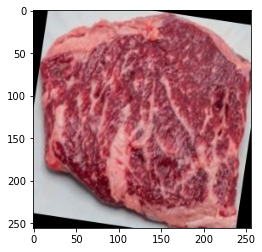

예측확률 [99  0  0]
예측값 0
실제 0


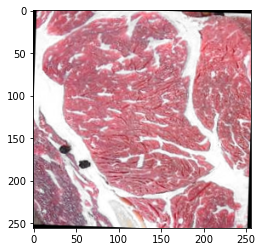

예측확률 [99  0  0]
예측값 0
실제 0


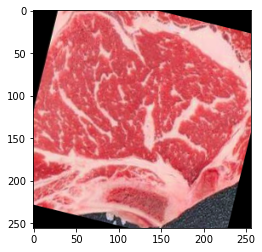

예측확률 [99  0  0]
예측값 0
실제 0


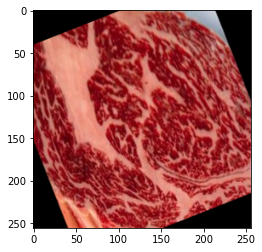

예측확률 [ 0 99  0]
예측값 1
실제 1


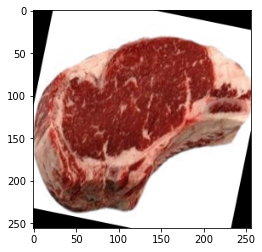

예측확률 [ 0 99  0]
예측값 1
실제 1


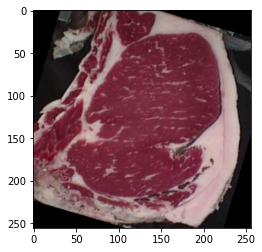

예측확률 [99  0  0]
예측값 0
실제 0


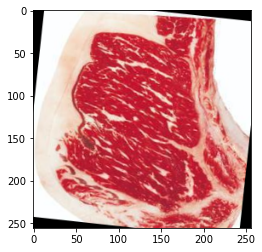

In [11]:
val,val_label = next(iter(ds_test))
print('0:Prime,1:Choice,2:Select')
for i in range(15):
    print('예측확률',np.array(model_aug(val)[i]*100,dtype=np.int16))
    print('예측값',model_aug(val)[i].numpy().argmax())
    print('실제',val_label[i].numpy())
    plt.imshow(val[i])
    plt.show()

## Visualization

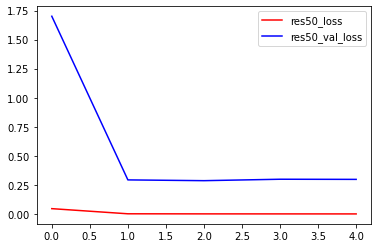

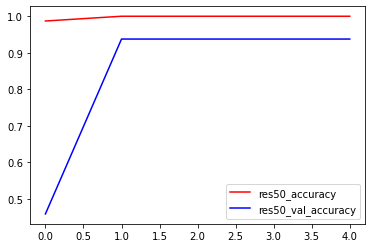

In [12]:
plt.plot(history_resnet50_aug.history['loss'], 'r')
plt.plot(history_resnet50_aug.history['val_loss'], 'b')
plt.legend(['res50_loss','res50_val_loss'], loc='upper right')
plt.show()
plt.plot(history_resnet50_aug.history['accuracy'], 'r')
plt.plot(history_resnet50_aug.history['val_accuracy'], 'b')
plt.legend(['res50_accuracy','res50_val_accuracy'], loc='lower right')
plt.show()

## Grad Cam: 컴퓨터가 어떠한 방식으로 단면을 관찰하는지 시각화

In [13]:
# model 불러오기
from tensorflow import keras
file_path = os.getenv('HOME') + '/aiffel/DeepBeef/'
model_path = file_path + 'resnet50'
cam_model = keras.models.load_model(model_path+'_aug_new_cam.h5')

In [14]:
from tensorflow import keras
cam_base_model = keras.applications.resnet.ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(256, 256,3),
    pooling='avg',
)
x = cam_base_model.output
preds = keras.layers.Dense(3, activation = 'softmax')(x)
cam_model=keras.Model(inputs=cam_base_model.input, outputs=preds)
cam_model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.01),
    metrics=['accuracy'],
)
history_resnet50_aug_cam = cam_model.fit(
    ds_train, # augmentation 적용하지 않은 데이터셋 사용
    steps_per_epoch= int(num_train_data/16), # 16은 배치 사이즈
    validation_steps = 3,
    epochs=5,
    validation_data=ds_test,
    verbose=1,
    use_multiprocessing=True,
)
model_path = file_path + 'resnet50'
cam_model.save(model_path+'_aug_new_cam.h5') # 모델저장

Epoch 1/5
637/637 [==============================] - 113s 170ms/step - loss: 0.1544 - accuracy: 0.9476 - val_loss: 2.1502 - val_accuracy: 0.4375
Epoch 2/5
637/637 [==============================] - 110s 172ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.2776 - val_accuracy: 0.9583
Epoch 3/5
637/637 [==============================] - 114s 179ms/step - loss: 7.3880e-04 - accuracy: 1.0000 - val_loss: 0.3034 - val_accuracy: 0.9375
Epoch 4/5
637/637 [==============================] - 113s 177ms/step - loss: 4.9692e-04 - accuracy: 1.0000 - val_loss: 0.3203 - val_accuracy: 0.9375
Epoch 5/5
637/637 [==============================] - 114s 179ms/step - loss: 3.6410e-04 - accuracy: 1.0000 - val_loss: 0.3333 - val_accuracy: 0.9375


In [15]:
def generate_cam(model, ds):
    # ds = copy.deepcopy(ds)
    img_tensor,class_idx = next(iter(ds_test))
    width = 256
    height = 256
    # img_tensor, class_idx[0] = normalize_and_resize_img(ds)
    # 학습한 모델에서 원하는 Layer의 output을 얻기 위해서 모델의 input과 output을 새롭게 정의해줍니다.
    # model.layers[-3].output에서는 우리가 필요로 하는 GAP 이전 Convolution layer의 output을 얻을 수 있습니다.
    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])
    conv_outputs, predictions = cam_model(tf.expand_dims(img_tensor[0], 0))
    
    conv_outputs = conv_outputs[0, :, :, :]
    class_weights = model.layers[-1].get_weights()[0] #마지막 모델의 weight activation을 가져옵니다.
    
    cam_image = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2])
    for i, w in enumerate(class_weights[:, class_idx[0]]):
        # W * f 를 통해 class별 activation map을 계산합니다.
        cam_image += w * conv_outputs[:, :, i]

    cam_image /= np.max(cam_image) # activation score를 normalize합니다.
    cam_image = cam_image.numpy()
    cam_image = cv2.resize(cam_image, (width, height)) # 원래 이미지의 크기로 resize합니다.
    return cam_image

In [16]:
def generate_grad_cam(model, activation_layer, ds,iters):
    
    width = 256
    height = 256
    img_tensor, class_idx = next(iter(ds))
    img_tensor = img_tensor[iters]
    class_idx = class_idx[iters]
    # Grad cam에서도 cam과 같이 특정 레이어의 output을 필요로 하므로 모델의 input과 output을 새롭게 정의합니다.
    # 이때 원하는 레이어가 다를 수 있으니 해당 레이어의 이름으로 찾은 후 output으로 추가합니다.
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(activation_layer).output, model.output])
    
    # Gradient를 얻기 위해 tape를 사용합니다.
    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0))
    
        loss = pred[:, class_idx] # 원하는 class(여기서는 정답으로 활용) 예측값을 얻습니다.
        output = conv_output[0] # 원하는 layer의 output을 얻습니다.
        grad_val = tape.gradient(loss, conv_output)[0] # 예측값에 따른 Layer의 gradient를 얻습니다.

    weights = np.mean(grad_val, axis=(0, 1)) # gradient의 GAP으로 class별 weight를 구합니다.
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        # 각 class별 weight와 해당 layer의 output을 곱해 class activation map을 얻습니다.
        grad_cam_image += w * output[:, :, k]
        
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
    return grad_cam_image

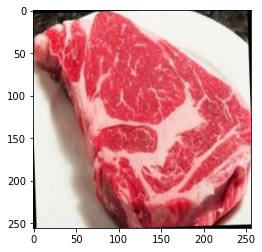

등급 0


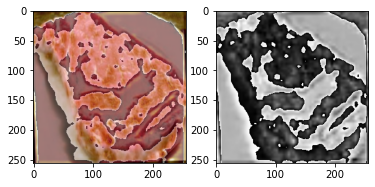

conv2_block1_1_bn


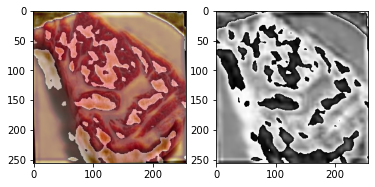

conv2_block1_2_bn


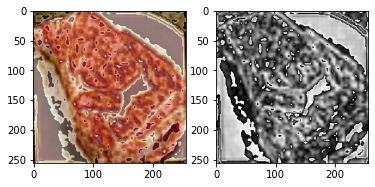

conv2_block2_1_bn


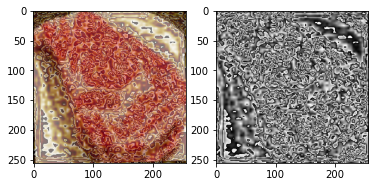

conv2_block2_2_bn


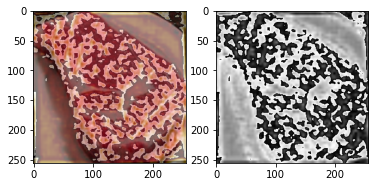

conv2_block3_1_bn


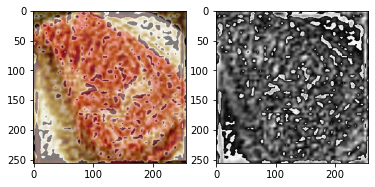

conv2_block3_2_bn


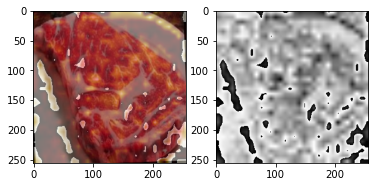

conv3_block1_1_bn


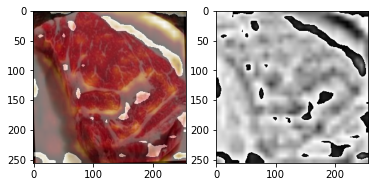

conv3_block1_2_bn


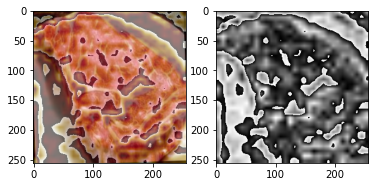

conv3_block2_1_bn


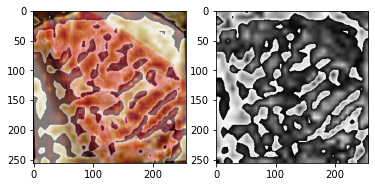

conv3_block2_2_bn


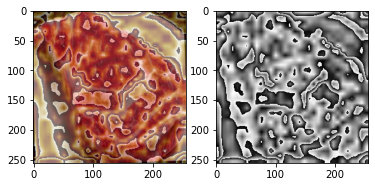

conv3_block3_1_bn


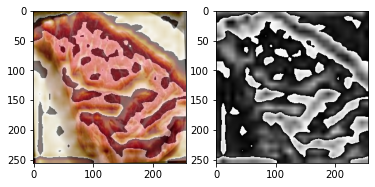

conv3_block3_2_bn


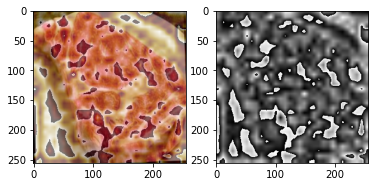

conv3_block4_1_bn


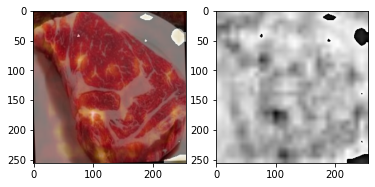

conv3_block4_2_bn


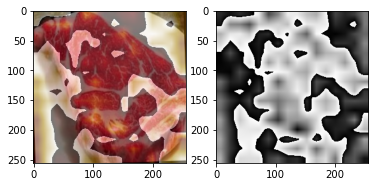

conv4_block1_1_bn


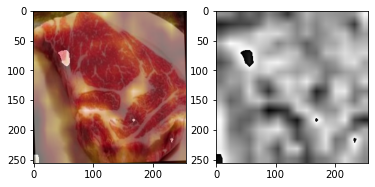

conv4_block1_2_bn


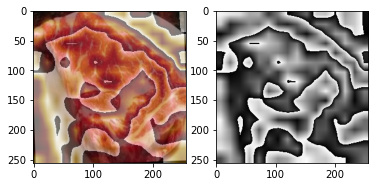

conv4_block2_1_bn


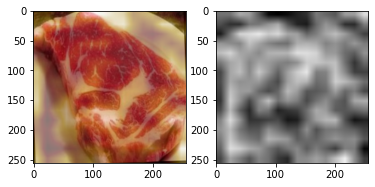

conv4_block2_2_bn


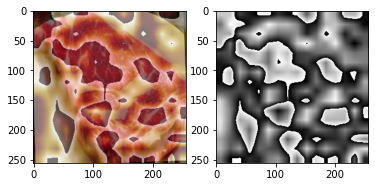

conv4_block3_1_bn


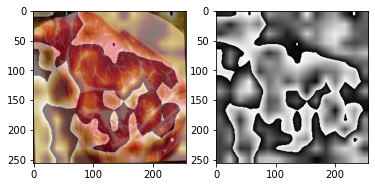

conv4_block3_2_bn


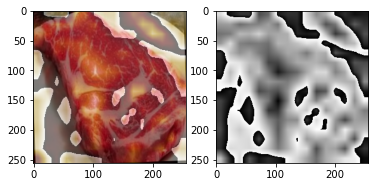

conv4_block4_1_bn


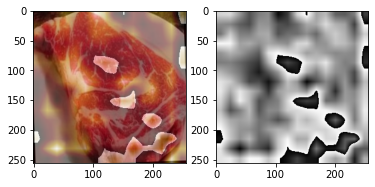

conv4_block4_2_bn


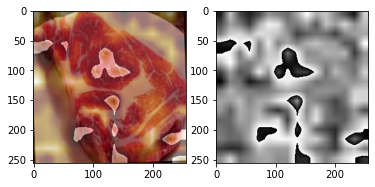

conv4_block5_1_bn


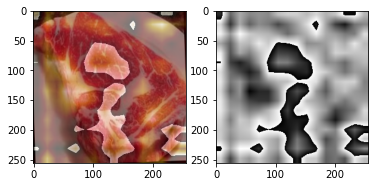

conv4_block5_2_bn


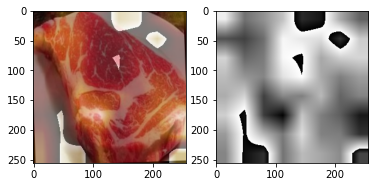

conv5_block1_1_bn


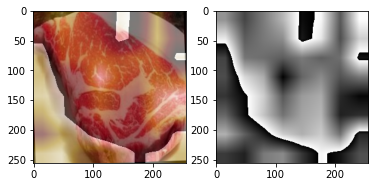

conv5_block1_2_bn


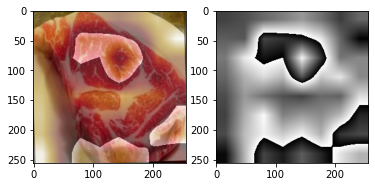

conv5_block2_1_bn


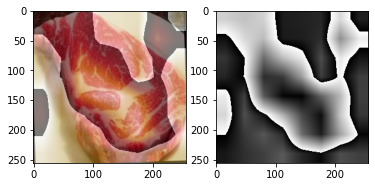

conv5_block2_2_bn


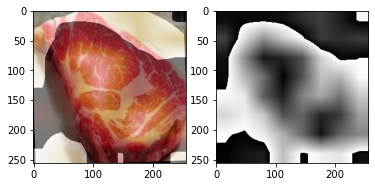

conv5_block3_1_bn


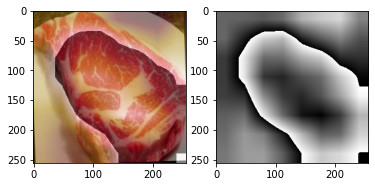

conv5_block3_2_bn


In [17]:
# plt.imshow(generate_cam(cam_model,ds_test))
# plt.imshow(generate_grad_cam(cam_model,'conv5_block3_1_relu',ds_test))
def visualize_cam_on_image(src1, src2, alpha=0.5):
    beta = (1.0 - alpha)
    heatmap = cv2.applyColorMap(np.uint8(src1),cv2.COLORMAP_OCEAN)
    merged_image = cv2.addWeighted(heatmap, alpha, np.uint8(src2*255), beta, 0)
    return merged_image
iters = 4 #배치중 몇번째 인지 입력
origin_image = next(iter(ds_test))[0][iters] 
plt.imshow(origin_image)
plt.show()
print('등급',next(iter(ds_test))[1][iters].numpy())
for i in range(2,6):
    for j in range(1,6):
        for k in range(1,3):
            try:
                camimage = generate_grad_cam(cam_model,'conv'+str(i)+'_block'+str(j)+'_'+str(k)+'_bn',ds_test,iters)
                camimage = np.stack([camimage*255]*3, axis=-1).astype(np.uint8)
                view_image = visualize_cam_on_image(camimage, origin_image)
                plt.subplot(1,2,1)
                plt.imshow(view_image)
                plt.subplot(1,2,2)
                plt.imshow(camimage*255)
                # plt.colorbar()
                plt.show()
                print('conv'+str(i)+'_block'+str(j)+'_'+str(k)+'_bn')
            except:
                pass
